In [1]:
# El experimento 13 y 15 tiene difernetes numero de Well en el csv que en el excel de nombre de los productos
# que es el excel de "cell metrics_3 copy.xlsx" 
# En el file 15, 19, 20 faltan 100 cycle finales

# Pending
# Nos pasen las fotos (el video), OJO! si las celulas se mueven muy rápido o toman pocas fotos no vamos a poder seguirlas. Que nos pasen solo uno y vemos si podemos seguirlas
# Que es cada columna
# Que nos cuadren los nombres con los Wells

# Notas:
# en la carpeta de cell_data_analyisi se sacan los datos de las cellulas, ojo que puedeser complicado como no se vean claramente.
# Aqui hay están los video de tu uni para analizarlo https://www.nanolive.ch/publication-biolab-universidad-de-la-laguna/
# No se mueven casi nada asi que con el codigo de object_tracking_from_scratch_source_cede puede valer (descargate el codigo de aqui que yo no lo puedo subir porque pesa mucho)
# aqui tienen el codigo de deteccion de celulas de celulas https://bmcbioinformatics.biomedcentral.com/articles/10.1186/s12859-020-03635-x

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
import os
%matplotlib inline

In [2]:
metrics = [1,2,3,4,5,6,7,8,9,10,13,15,16,19,20]

file = f'data/original/Cell metrics_{metrics[0]} copy.csv'
df = pd.read_csv(file)
df

,Well,Cycle,Time,Cell Index,Cell area [um^2],Cell area [%],Cell perimeter [um],Cell form factor,Cell extent,Cell compactness,Cell eccentricity,Mean RI,Average dry mass density [pg / um^3],Dry mass [pg],Cell granularity
0,A1,1,00:00:20,1,471.48,0.776572,275.3940,0.078120,0.425646,12.80080,0.735266,1.34773,0.088648,133.747,5.86423
1,A1,1,00:00:20,2,408.56,0.672937,139.5090,0.263790,0.525547,3.79089,0.847883,1.34878,0.093876,122.733,7.12153
2,A1,1,00:00:20,3,737.20,1.214240,354.5060,0.073714,0.398504,13.56600,0.910670,1.34362,0.068090,160.628,9.07188
3,A1,1,00:00:20,4,495.96,0.816893,166.9360,0.223645,0.403220,4.47138,0.925866,1.34592,0.079605,126.339,6.13479
4,A1,1,00:00:20,5,483.96,0.797128,169.2730,0.212248,0.616196,4.71146,0.779687,1.34906,0.095314,147.609,7.78636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40589,B2,400,19:58:42,10,278.92,0.459408,83.8063,0.499041,0.690533,2.00384,0.478492,1.37901,0.245073,218.738,7.51191
40590,B2,400,19:58:42,11,457.08,0.752854,110.9060,0.466975,0.624426,2.14144,0.677771,1.35923,0.146156,213.776,4.54448
40591,B2,400,19:58:42,12,336.36,0.554017,103.1270,0.397437,0.619584,2.51612,0.400319,1.37027,0.201356,216.730,6.42875
40592,B2,400,19:58:42,13,324.28,0.534120,92.8264,0.472919,0.619328,2.11453,0.501096,1.36710,0.185498,192.490,5.45029


In [3]:
# Check de size of the data in all the files
for metric in metrics:
    # load the file
    file = f'data/original/Cell metrics_{metrics[0]} copy.csv'
    df = pd.read_csv(file)
    
    #check if there is NaNs in the data
    # and if there is NaNs print how many
    if df.isnull().values.any():
        print(f'File {metric} has {df.isnull().sum()} NaNs out of {len(df)}: {df.shape}')
    else:
        print(f'File {metric} has not NaNs: {df.shape}')

File 1 has not NaNs: (40594, 15)
File 2 has not NaNs: (40594, 15)
File 3 has not NaNs: (40594, 15)
File 4 has not NaNs: (40594, 15)
File 5 has not NaNs: (40594, 15)
File 6 has not NaNs: (40594, 15)
File 7 has not NaNs: (40594, 15)
File 8 has not NaNs: (40594, 15)
File 9 has not NaNs: (40594, 15)
File 10 has not NaNs: (40594, 15)
File 13 has not NaNs: (40594, 15)
File 15 has not NaNs: (40594, 15)
File 16 has not NaNs: (40594, 15)
File 19 has not NaNs: (40594, 15)
File 20 has not NaNs: (40594, 15)


In [4]:
df_compounds = pd.read_excel('data/original/Nombre de los productos.xlsx',header=0, names=["Index","A1","A2","B1","B2"])
#df_compounds.set_index('Index',inplace=True)
#df_compounds.columns = ["A1","A2","B1","B2"]
df_compounds.index = list(df_compounds['Index'])
del df_compounds['Index']
df_compounds

,A1,A2,B1,B2
1,Control,Taxol,Vimblastina,Colchicina
2,Control,Cisplatino,DTA100,NaN
3,Control,5-fluouracilo,Nocodazol,etoposido
4,Control,control,Taxol,Vinblastina
5,ControlSw,Tamoxifeno,Rapamycin,cloroquine
6,Control,Control,Rapamycin,cloroquine
7,Vimblastina,Colchicina,DTA100,Doxorubicina
8,Etoposido,DTA100,Colchicina,Taxol
9,Control,5 Fluoracilo,Vimblastina,Tamoxifeno
10,Doxorubicina,DTA100,Control,Tamoxifeno


In [5]:
# Check de name of the columns 
i = 1
new_file = f'data/metrics_{i}.csv'
old_file = f'data/original/Cell metrics_{i} copy.csv'
if os.path.exists(new_file):
    df = pd.read_csv(new_file)
else:
    df = pd.read_csv(old_file)

columns_names =  set(df.columns)
print(f"Metric 1 has the columns:\n {columns_names}")

for i in metrics:
    new_file = f'data/metrics_{i}.csv'
    old_file = f'data/original/Cell metrics_{i} copy.csv'
    if os.path.exists(new_file):
        df = pd.read_csv(new_file)
    else:
        df = pd.read_csv(old_file)
    
    current_columns = set(df.columns)
    if len(current_columns-columns_names):
        print(f"Metric {i} has {len(current_columns-columns_names)} columns than are differente from Metric 1")
        print(current_columns-columns_names)
    if len(columns_names - current_columns):
        print(f"Metric 1 has {len(columns_names - current_columns)} columns than are differente from Metric {i}")
        print(columns_names - current_columns)

Metric 1 has the columns:
 {'Compactness', 'Granularity', 'Perimeter [um]', 'Well', 'Cycle', 'Object Index', 'Area [%]', 'Form factor', 'Characteristic dry mass density [pg / um^3]', 'Time', 'Dry mass [pg]', 'Extent', 'Eccentricity', 'Area [um^2]', 'Characteristic RI'}


In [6]:
# Rename the headers of the df to have the same in all the files
file = f'data/original/Cell metrics_1 copy.csv'
df = pd.read_csv(file)
columns_names =  set(df.columns)

for i in metrics:
    
    new_file = f'data/metrics_{i}.csv'
    old_file = f'data/original/Cell metrics_{i} copy.csv'
    if os.path.exists(new_file):
        df_old = pd.read_csv(new_file)
    else:
        df_old = pd.read_csv(old_file)

    old_header = "Cell extent"

    new_file = f'data/metrics_{i}.csv'    
    new_header = "Extent"
    
    if old_header in df_old.columns:
        df_old.rename(columns={old_header:new_header},inplace=True)
        df_old.to_csv(new_file,index=False)

In [7]:
# Move the rest of the df
for i in metrics:
    new_file = f'data/metrics_{i}.csv'
    old_file = f'data/original/Cell metrics_{i} copy.csv'
    if not os.path.exists(new_file):
        df_old = pd.read_csv(old_file)
        df_old.to_csv(new_file,index=False)

In [8]:
# Check that all have the same columns
# Check de name of the columns 
i = 1
new_file = f'data/metrics_{i}.csv'
df = pd.read_csv(new_file)
columns_names =  set(df.columns)

for i in metrics:
    file = f'data/metrics_{i}.csv'
    df = pd.read_csv(file)
    
    current_columns = set(df.columns)
    if len(current_columns-columns_names)>0:
        print(f"Metric {i} has {len(current_columns-columns_names)} columns than are differente from Metric 1")
        print(current_columns-columns_names)
    else:
        print(f"Metric {i} has the same columns than Metric 1")
    if len(columns_names - current_columns):
        print(f"Metric 1 has {len(columns_names - current_columns)} columns than are differente from Metric {i}")
        print(columns_names - current_columns)
    else:
        print(f"Metric 1 has the same columns than Metric {i}")

Metric 1 has the same columns than Metric 1
Metric 1 has the same columns than Metric 1
Metric 2 has the same columns than Metric 1
Metric 1 has the same columns than Metric 2
Metric 3 has the same columns than Metric 1
Metric 1 has the same columns than Metric 3
Metric 4 has the same columns than Metric 1
Metric 1 has the same columns than Metric 4
Metric 5 has the same columns than Metric 1
Metric 1 has the same columns than Metric 5
Metric 6 has the same columns than Metric 1
Metric 1 has the same columns than Metric 6
Metric 7 has the same columns than Metric 1
Metric 1 has the same columns than Metric 7
Metric 8 has the same columns than Metric 1
Metric 1 has the same columns than Metric 8
Metric 9 has the same columns than Metric 1
Metric 1 has the same columns than Metric 9
Metric 10 has the same columns than Metric 1
Metric 1 has the same columns than Metric 10
Metric 13 has the same columns than Metric 1
Metric 1 has the same columns than Metric 13
Metric 15 has the same colum

In [9]:
# check how many compounnds are in the each file
for metric in metrics:
    # load the file
    file = f'data/metrics_{metric}.csv'
    df = pd.read_csv(file)
    names= df_compounds.loc[metric].dropna().values
    wells = df["Well"].unique()
    #check how many compounds are in the file
    print(f'File {metric} has {len(wells)} compounds and {len(names)} names:',[f"{x} = {name}" for x ,name in zip(wells,names)])
    if len(wells) != len(names):
        print("ERROR")
# XXX Antes me daba error pero para poder ver las gráficas bien he supuesto que estan curzadas 

File 1 has 4 compounds and 4 names: ['A1 = Control', 'A2 = Taxol', 'B1 = Vimblastina', 'B2 = Colchicina']
File 2 has 3 compounds and 3 names: ['A1 = Control', 'A2 = Cisplatino', 'B1 = DTA100']
File 3 has 4 compounds and 4 names: ['A1 = Control', 'A2 = 5-fluouracilo', 'B1 = Nocodazol', 'B2 = etoposido']
File 4 has 4 compounds and 4 names: ['A1 = Control', 'A2 = control', 'B1 = Taxol', 'B2 = Vinblastina']
File 5 has 4 compounds and 4 names: ['A1 = ControlSw', 'A2 = Tamoxifeno', 'B1 = Rapamycin', 'B2 = cloroquine']
File 6 has 4 compounds and 4 names: ['A1 = Control', 'A2 = Control', 'B1 = Rapamycin', 'B2 = cloroquine']
File 7 has 4 compounds and 4 names: ['A1 = Vimblastina', 'A2 = Colchicina', 'B1 = DTA100', 'B2 = Doxorubicina']
File 8 has 4 compounds and 4 names: ['A1 = Etoposido', 'A2 = DTA100', 'B1 = Colchicina', 'B2 = Taxol']
File 9 has 4 compounds and 4 names: ['A1 = Control', 'A2 = 5 Fluoracilo', 'B1 = Vimblastina', 'B2 = Tamoxifeno']
File 10 has 4 compounds and 4 names: ['A1 = Doxo

In [10]:
# XXX Antes me daba error pero para poder ver las gráficas bien he supuesto que estan mal el 13 y 15 y falta control en la 20
df_compounds = pd.read_excel('data/Nombre de los productos.xlsx', index_col=0)
df_compounds = df_compounds[df_compounds.index.notnull()]

# To be able to see what happen with th control group it will be usefull to map the metric and the component
dict_compounds = df_compounds.to_dict(orient='index')
df_compounds

,1,2,3,4
1.0,Control,Taxol,Vimblastina,Colchicina
2.0,Control,Cisplatino,DTA100,NaN
3.0,Control,5-fluouracilo,Nocodazol,etoposido
4.0,Control,control,Taxol,Vinblastina
5.0,ControlSw,Tamoxifeno,Rapamycin,cloroquine
6.0,Control,Control,Rapamycin,cloroquine
7.0,Vimblastina,Colchicina,DTA100,Doxorubicina
8.0,Etoposido,DTA100,Colchicina,Taxol
9.0,Control,5 Fluoracilo,Vimblastina,Tamoxifeno
10.0,Doxorubicina,DTA100,Control,Tamoxifeno


In [11]:
for metric in metrics:
    # load the file
    file = f'data/metrics_{metric}.csv'
    df = pd.read_csv(file)
    names= df_compounds.loc[metric].dropna().values
    wells = df["Well"].unique()
    #check how many compounds are in the file
    print(f'File {metric} has {len(wells)} compounds and {len(names)} names:',[f"{x} = {name}" for x ,name in zip(wells,names)])
    if len(wells) != len(names):
        print("ERROR")


File 1 has 4 compounds and 4 names: ['A1 = Control', 'A2 = Taxol', 'B1 = Vimblastina', 'B2 = Colchicina']
File 2 has 3 compounds and 3 names: ['A1 = Control', 'A2 = Cisplatino', 'B1 = DTA100']
File 3 has 4 compounds and 4 names: ['A1 = Control', 'A2 = 5-fluouracilo', 'B1 = Nocodazol', 'B2 = etoposido']
File 4 has 4 compounds and 4 names: ['A1 = Control', 'A2 = control', 'B1 = Taxol', 'B2 = Vinblastina']
File 5 has 4 compounds and 4 names: ['A1 = ControlSw', 'A2 = Tamoxifeno', 'B1 = Rapamycin', 'B2 = cloroquine']
File 6 has 4 compounds and 4 names: ['A1 = Control', 'A2 = Control', 'B1 = Rapamycin', 'B2 = cloroquine']
File 7 has 4 compounds and 4 names: ['A1 = Vimblastina', 'A2 = Colchicina', 'B1 = DTA100', 'B2 = Doxorubicina']
File 8 has 4 compounds and 4 names: ['A1 = Etoposido', 'A2 = DTA100', 'B1 = Colchicina', 'B2 = Taxol']
File 9 has 4 compounds and 4 names: ['A1 = Control', 'A2 = 5 Fluoracilo', 'B1 = Vimblastina', 'B2 = Tamoxifeno']
File 10 has 4 compounds and 4 names: ['A1 = Doxo

In [12]:
# Check how many cells are in each picture, to know how much data we could obtain if we would use the evoltion of each cell. 
for metric in metrics:
    file = f'data/metrics_{metric}.csv'
    df = pd.read_csv(file)  
    list_info = []
    for well in df['Well'].unique():
       for cycle in df['Cycle'].unique():
          list_info.append([well, cycle, df[(df['Well']==well) & (df['Cycle']==cycle)].shape[0]])


In [13]:
df_distribution = pd.DataFrame(list_info,columns=['Well',"Cycle","Num. cells"])

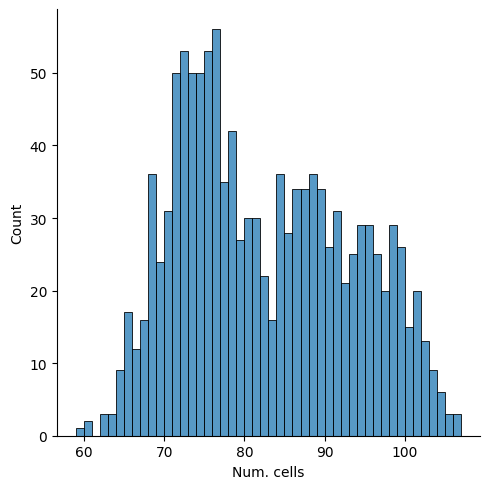

In [14]:
# Ther wil be data with 400 time steps (all the time frame) and other will less. We could see the distribution of this
import seaborn as sns
sns.displot(df_distribution, x="Num. cells",binwidth=1)


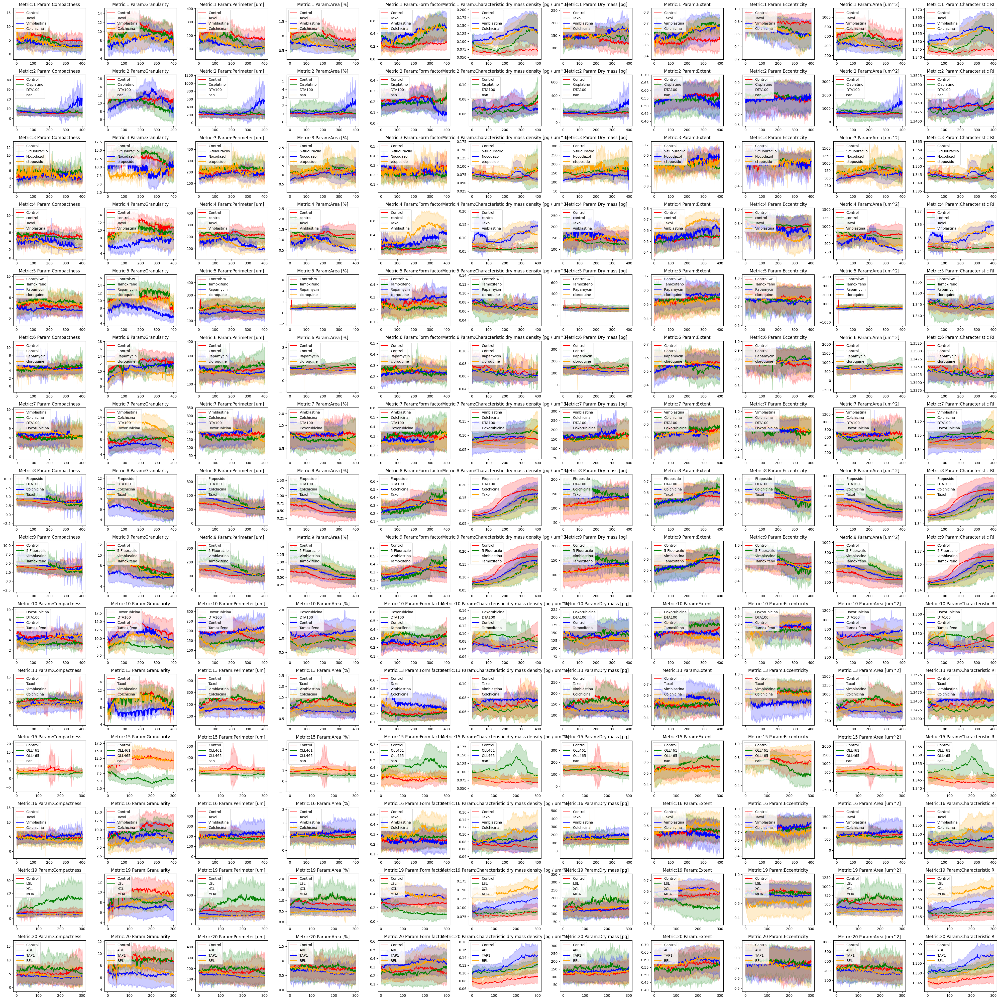

In [15]:
df = pd.read_csv('data/metrics_1.csv')
columns_names =  set(df.columns)
# remove the cycle, time, well and object index
columns_names.remove("Well")
columns_names.remove("Time")
columns_names.remove("Cycle")
columns_names.remove("Object Index")

fig, axs = plt.subplots(len(metrics), len(columns_names),figsize=(40,40))

for col_ind, col in enumerate(columns_names):
    for row_met, metric in enumerate(metrics):
        file = f'data/metrics_{metric}.csv'
        df = pd.read_csv(file)

        # do the mean of the area where the cycle is the same
        cycle_a1 = df['Cycle'][df['Well'] == 'A1'].unique()
        metric_a1 = df[col][df['Well'] == 'A1'].groupby(df['Cycle'][df['Well'] == 'A1']).mean()
        metric_a1_std = df[col][df['Well'] == 'A1'].groupby(df['Cycle'][df['Well'] == 'A1']).std()

        # do the mean of the area where the cycle is the same
        cycle_a2 = df['Cycle'][df['Well'] == 'A2'].unique()
        metric_a2 = df[col][df['Well'] == 'A2'].groupby(df['Cycle'][df['Well'] == 'A2']).mean()
        metric_a2_std = df[col][df['Well'] == 'A2'].groupby(df['Cycle'][df['Well'] == 'A2']).std()

        # do the mean of the area where the cycle is the same
        cycle_b1 = df['Cycle'][df['Well'] == 'B1'].unique()
        metric_b1 = df[col][df['Well'] == 'B1'].groupby(df['Cycle'][df['Well'] == 'B1']).mean()
        metric_b1_std = df[col][df['Well'] == 'B1'].groupby(df['Cycle'][df['Well'] == 'B1']).std()

        # do the mean of the area where the cycle is the same
        cycle_b2 = df['Cycle'][df['Well'] == 'B2'].unique()
        metric_b2 = df[col][df['Well'] == 'B2'].groupby(df['Cycle'][df['Well'] == 'B2']).mean()
        metric_b2_std = df[col][df['Well'] == 'B2'].groupby(df['Cycle'][df['Well'] == 'B2']).std()

        axs[row_met, col_ind].plot(cycle_a1,metric_a1, color='r', label=dict_compounds[metric][1])
        axs[row_met, col_ind].fill_between(cycle_a1, metric_a1-metric_a1_std, metric_a1+metric_a1_std, color='r', alpha=0.2)
        axs[row_met, col_ind].plot(cycle_a2,metric_a2, color='g', label=dict_compounds[metric][2])
        axs[row_met, col_ind].fill_between(cycle_a2, metric_a2-metric_a2_std, metric_a2+metric_a2_std, color='g', alpha=0.2)
        axs[row_met, col_ind].plot(cycle_b1,metric_b1, color='b', label=dict_compounds[metric][3])
        axs[row_met, col_ind].fill_between(cycle_b1, metric_b1-metric_b1_std, metric_b1+metric_b1_std, color='b', alpha=0.2)
        axs[row_met, col_ind].plot(cycle_b2,metric_b2, color='orange', label=dict_compounds[metric][4])
        axs[row_met, col_ind].fill_between(cycle_b2, metric_b2-metric_b2_std, metric_b2+metric_b2_std, color='orange', alpha=0.2)
        axs[row_met, col_ind].set_title(f'{col}')
        axs[row_met, col_ind].set_title(f'Metric:{metric} Param:{col}')
        axs[row_met, col_ind].legend(loc='upper left')
        # axs[row_met, col_ind].grid()
        # print(f"plotting {row_met} {col_ind}")
        
plt.tight_layout()
plt.show()  

In [16]:
# List of DataFrames
df_list = [pd.DataFrame({x: df[df['Well']==x][col].values}) for x in df['Well'].unique()]

# Concatenate the DataFrames along columns (axis=1)
result_df = pd.concat(df_list, axis=1)

result_df

,A1,A2,B1,B2
0,1.34519,1.35003,1.34975,1.34516
1,1.34521,1.34897,1.35573,1.34651
2,1.34441,1.34872,1.35312,1.34515
3,1.34552,1.34549,1.35948,1.34814
4,1.34801,1.34638,1.34727,1.35508
...,...,...,...,...
28168,NaN,NaN,1.35819,NaN
28169,NaN,NaN,1.35263,NaN
28170,NaN,NaN,1.35903,NaN
28171,NaN,NaN,1.36429,NaN


In [17]:
# Este grafico esta muy bien pero me molaría vir si son estadisticamente diferentes (la media)
col = "Area [um^2]"
df_list = []
for metric in metrics:
    file = f'data/metrics_{metric}.csv'
    df = pd.read_csv(file)
    # List of DataFrames
    for x in df['Well'].unique():
        df_list.append(pd.DataFrame({str(metric)+x: df[df['Well']==x][col].values}))

# Concatenate the DataFrames along columns (axis=1)
result_df = pd.concat(df_list, axis=1)

result_df

,1A1,1A2,1B1,1B2,2A1,2A2,2B1,3A1,3A2,3B1,...,16B1,16B2,19A1,19A2,19B1,19B2,20A1,20A2,20B1,20B2
0,471.48,194.16,194.16,1200.72,398.68,702.84,1342.40,521.60,991.80,396.84,...,1038.88,148.40,265.56,208.24,423.12,200.36,237.88,657.44,330.60,281.80
1,408.56,483.40,175.20,558.24,314.44,537.80,323.76,891.24,433.24,298.32,...,951.24,395.56,886.88,175.36,378.28,222.52,223.64,223.24,243.08,352.64
2,737.20,237.84,433.76,600.00,482.76,682.12,1003.92,665.40,352.56,445.32,...,194.40,1009.44,803.44,248.28,377.00,245.48,382.36,408.48,249.76,616.20
3,495.96,318.00,244.24,983.60,450.88,754.64,933.48,1008.92,617.52,428.88,...,289.16,339.24,438.12,298.76,577.92,245.16,473.88,623.72,163.80,430.84
4,483.96,501.68,189.88,824.96,697.00,882.32,790.12,983.24,721.24,522.00,...,637.28,262.60,441.24,503.00,208.52,258.08,333.68,412.20,507.08,658.68
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59401,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59402,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59403,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
# Function to calculate p-values for each pair of columns
def calculate_p_values(dataframe):
    p_values = np.ones((len(dataframe.columns), len(dataframe.columns)))
    alpha = 0.05

    for i in range(len(dataframe.columns)):
        for j in range(i+1, len(dataframe.columns)):
            column1 = dataframe.columns[i]
            column2 = dataframe.columns[j]
            df_clean = dataframe[[column1,column2]].dropna()

            t_statistic, p_value = ttest_ind(df_clean[column1], df_clean[column2])
            #if p_value < alpha:
            p_values[i, j] = p_value
            p_values[j, i] = p_value

    return p_values

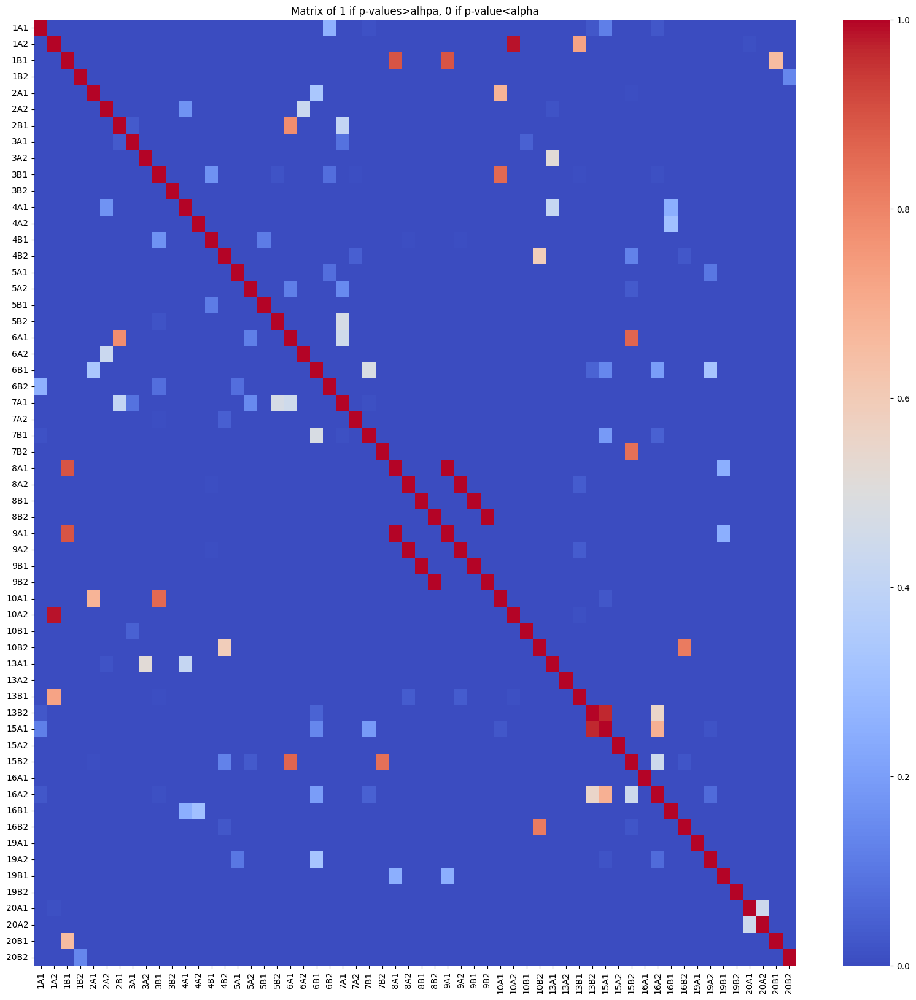

In [19]:
p_values_matrix = calculate_p_values(result_df)
# Create a heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(p_values_matrix, cmap='coolwarm', xticklabels=result_df.columns, yticklabels=result_df.columns)
plt.title('Matrix of 1 if p-values>alhpa, 0 if p-value<alpha')
plt.show()

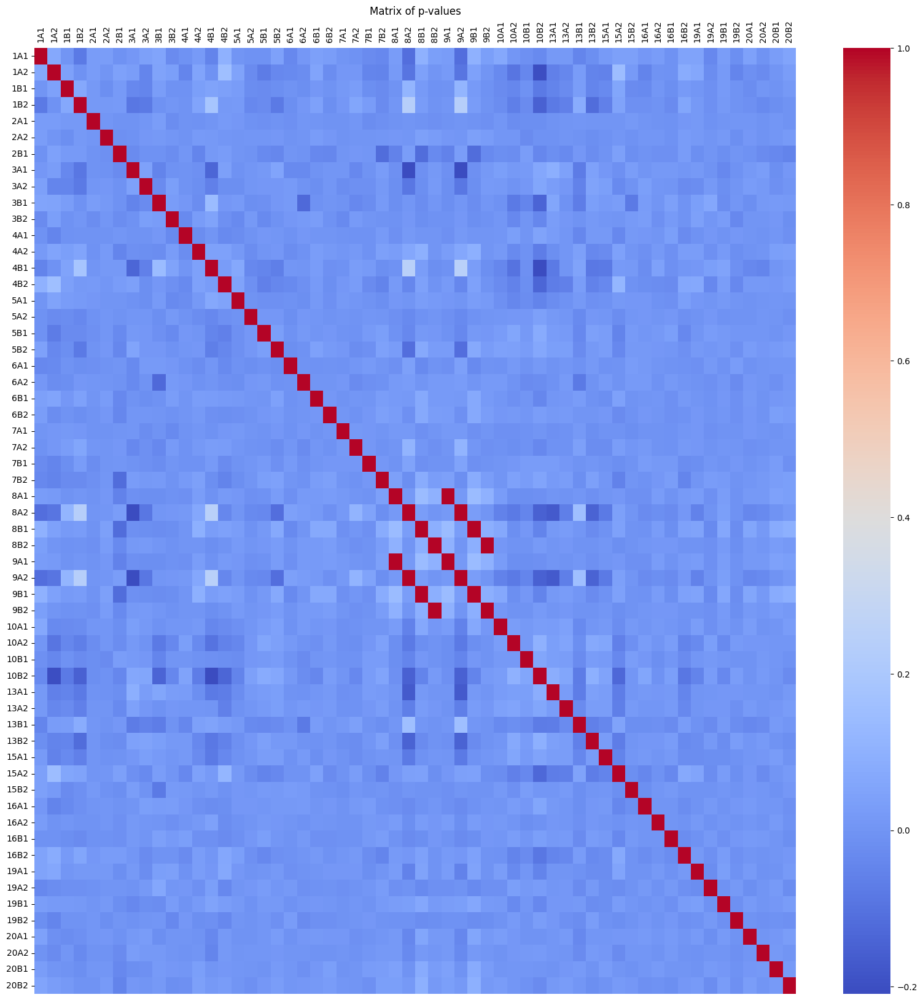

In [20]:
plt.figure(figsize=(20, 20))
sns.heatmap(result_df.corr().values, cmap='coolwarm',xticklabels=result_df.columns, yticklabels=result_df.columns)
plt.tick_params(labelbottom = False, bottom=False, top = False, labeltop=True)
plt.xticks(rotation=90)
plt.title('Matrix of p-values')
plt.show()

In [21]:
# XXX salen cosas interesta 1)hay datos que estan copiados, 2)hacer esto para todos los parámetrox 
# Ruben hacer lo de deteccion de imaganes
# Ruben  pensacar como sacar estas metricas para una imagen